In [ ]:
import torch
import numpy as np
import torchvision
from torchvision import transforms, datasets, models
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import os
import cv2

from torch.utils.data import Dataset
from skimage import io
import matplotlib.pyplot as plt
from torchvision.io import read_image
from google.colab.patches import cv2_imshow
from tqdm.notebook import tqdm
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

# Q1) Labeled faces in the wild (LFW) dataset

In [ ]:
files=[] # This list stores the names of the files
index=[] # This stores the index of the list where there are multiple faces of a single person
j=0
for root,dir,file_name in os.walk('/content/drive/MyDrive/Siamese'):
    if(len(file_name) != 0): # file is not empty
        f=[]
        for k in file_name:
            f.append(os.path.join(root,k))
        files.append(f)
        if (len(file_name)>1):
            index.append(j) #storing index if len(file)>1
        j+=1


# Q2)  Number of persons who have more than one image

In [ ]:
len(index)

1680

# Q3) Spliting in Training and Test Sets By Person

**Note**: that the below is the train-test set we will further split the this training set into validation set in Q(6)

In [ ]:
files_test=files.copy()
index_test=index[500:]
files=files[0:1800] # Selecting a part of the DataSet for training
index=index[0:500]

# Q4) Network pre-trained on ImageNet and removing last layer for transfer learning

In [ ]:
pre_trained_model = models.resnet50(pretrained=True)
pre_trained_model = nn.Sequential(*list(pre_trained_model.children())[:-1]) #We remove the last layer
for params in pre_trained_model.parameters():
    params.requires_grad = False #Gradient flow is not present

# Q5) Appropriately croping and resizing the images to 224x224x3

In [ ]:
def convert(inp):
    inp = inp.clone().detach().float() / 255
    transform=transforms.Compose([
        transforms.Resize(256),  # Resize to 256x256x3
        transforms.CenterCrop(224),  # Center-crop to 224x224
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Mean and SD of Resnet
    ])

    return transform(inp)

# Q6) Setup and train a Siamese network using Cosine Similarity

## Q6) (a)  Using Image Augmentation

In [ ]:
class SiameseDataset(Dataset):
    def __init__(self,files,index,num,augment=True):
        self.num=num
        self.files=files
        self.index=index
        self.arg=augment
    def __len__(self):
        return self.num


    def __getitem__(self,i):
        #X=[]
        #Y=[]
        l=len(self.files) # no. of distict inputs
        k=len(self.index) # no. of inputs with more that 2 images of same person
        if (i%2!=0):
            m=np.random.choice(np.arange(l),2,replace=False) #choosing index for files
            i1=convert(read_image(np.random.choice(np.array(self.files[m[0]]),1,replace=False)[0]))
            i2=convert(read_image(np.random.choice(np.array(self.files[m[1]]),1,replace=False)[0]))

            ## Image Augmentation

            augmentation=transforms.Compose([transforms.RandomHorizontalFlip(0.5),
            transforms.RandomRotation(5)
            # ,transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
            ])
            # r=np.random.random(2)
            # if (r[0] < 0.5 and self.arg):
            #     i1=augmentation(i1)
            # if (r[1] <0.5 and self.arg):
            #     i2=augmentation(i2)
            i1=augmentation(i1)
            i2=augmentation(i2)
            return i1,i2,torch.tensor(-1,dtype=torch.float)
            #X.append([i1,i2]),Y.append(torch.tensor(0,dtype=torch.float))
        else:
            m=np.random.randint(0,k) #choosing index for index list
            index_value=self.index[m]
            i1,i2=np.random.choice(np.array(self.files[index_value]),2,replace=False)
            i1=convert(read_image(i1))
            i2=convert(read_image(i2))
            augmentation=transforms.Compose([transforms.RandomHorizontalFlip(0.5),
            transforms.RandomRotation(5),
            #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
            ])
            # r=np.random.random(2)
            # if (r[0] < 0.5 and self.arg):
            #     i1=augmentation(i1)
            # if (r[1] <0.5 and self.arg):
            #     i2=augmentation(i2)
            i1=augmentation(i1)
            i2=augmentation(i2)
            return i1,i2,torch.tensor(1,dtype=torch.float)
            #X.append([i1,i2]),Y.append(torch.tensor(1,dtype=torch.float))
        #return torch.tensor(X), torch.tensor(Y)



**Confirming that the Gradient doesn not flow through the pretrained Model**

In [ ]:
for params in pre_trained_model:
    print(params.requires_grad)

False
False
False
False
False
False
False
False
False


In [ ]:
[p for p in pre_trained_model.parameters()][1]

Parameter containing:
tensor([2.3888e-01, 2.9136e-01, 3.1615e-01, 2.7122e-01, 2.1731e-01, 3.0903e-01,
        2.2937e-01, 2.3086e-01, 2.1129e-01, 2.8054e-01, 1.9923e-01, 3.1894e-01,
        1.7955e-01, 1.1246e-08, 1.9704e-01, 2.0996e-01, 2.4317e-01, 2.1697e-01,
        1.9415e-01, 3.1569e-01, 1.9648e-01, 2.3214e-01, 2.1962e-01, 2.1633e-01,
        2.4357e-01, 2.9683e-01, 2.3852e-01, 2.1162e-01, 1.4492e-01, 2.9388e-01,
        2.2911e-01, 9.2716e-02, 4.3334e-01, 2.0782e-01, 2.7990e-01, 3.5804e-01,
        2.9315e-01, 2.5306e-01, 2.4210e-01, 2.1755e-01, 3.8645e-01, 2.1003e-01,
        3.6805e-01, 3.3724e-01, 5.0826e-01, 1.9341e-01, 2.3914e-01, 2.6652e-01,
        3.9020e-01, 1.9840e-01, 2.1694e-01, 2.6666e-01, 4.9806e-01, 2.3553e-01,
        2.1349e-01, 2.5951e-01, 2.3547e-01, 1.7579e-01, 4.5354e-01, 1.7102e-01,
        2.4903e-01, 2.5148e-01, 3.8020e-01, 1.9665e-01], requires_grad=True)

### Spliting into Training and Validation

In [ ]:
#Defing testing and Training datasets
from torch.utils.data import Dataset, Subset, DataLoader
n=2000
train_dataset = SiameseDataset(files,index,2000)
# test_dataset = SiameseDataset(files,index,2)
def train_val_dataset(dataset, val_split=0.1):
    split_idx = int(len(dataset) * (1-val_split))
    datasets = {}
    datasets['train'] = Subset(dataset, range(split_idx))
    datasets['val'] = Subset(dataset, range(split_idx, len(dataset)))
    return datasets
train_dataset=train_val_dataset(SiameseDataset(files,index,2000), val_split=0.1)['train']
test_dataset=train_val_dataset(SiameseDataset(files,index,2000), val_split=0.1)['val']

In [ ]:
from torch.utils.data import DataLoader
## Seting batch size and feeding in to the DataLoader
batch_size = 16
## Dataloader gives us the dat batch-wise segregated
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

## Q6) (b) Experimenting with  Regularization Technique: **Dropout** and **Weight Decay** (L2 Regularization) in Siamese Network Model

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
pre_trained_model = models.resnet50(pretrained=True)
pre_trained_model = nn.Sequential(*list(pre_trained_model.children())[:-1])
for params in pre_trained_model.parameters():
    params.requires_grad = False
class SiameseNetwork(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()
        self.base_model = base_model
        self.fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Dropout(0.1), # Regularization
            nn.Linear(1024,128)
            # nn.ReLU(),
            # nn.Linear(128,32),
            # nn.ReLU()
            # ,nn.Linear(128,64)
            # ,nn.ReLU()
        )
        self.cos = torch.nn.CosineSimilarity(dim=1, eps=1e-08)
        # self.fc.weight.requires_grad = True  # Ensure requires_grad is set to True
        # self.fc.bias.requires_grad = True
    def forward_one(self, x):
        x = self.base_model(x)

        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1,output2
model=SiameseNetwork(pre_trained_model)
model=model.to(device)
# model
# for param in model.parameters():
#     param.requires_grad = True

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


**By experimenting with Droupout and Weight-Decay, I found out that p=0.1 and decay=1e-4 are a suitable hyper-parameters**

## Epochs: Training and Validation

In [ ]:
def validate_one_epoch():
    model.eval()
    running_loss = 0.0
 #setting up validating for an epoch
    for batch_index, batch in enumerate(test_loader):
        x_batch_1,x_batch_2, y_batch = batch[0].to(device), batch[1].to(device), batch[2].to(device)

        with torch.no_grad():
            output = model(x_batch_1,x_batch_2)
            loss = cos_loss(output[0],output[1], y_batch)
            running_loss += loss.item() #Calc aggregate Loss

    avg_loss_across_batches = running_loss / len(test_loader)

    print('Val Loss: {0:.3f}'.format(avg_loss_across_batches))
    print('***************************************************')
    print()

In [ ]:
def train_one_epoch():
    model.train()
    print(f'Epoch: {epoch + 1}')
    running_loss = 0.0
    # sum=0
#setting up training of an epoch
    for batch_index, batch in enumerate(train_loader):
        x_batch_1,x_batch_2, y_batch = batch[0].to(device), batch[1].to(device), batch[2].to(device)


        output = model(x_batch_1,x_batch_2)
        #print(x_batch_1.dtype, )
        loss = cos_loss(output[0],output[1], y_batch)
        running_loss += loss.detach().item()#Calc aggregate Loss
        # print(output,loss,y_batch)
        out1=output[0].detach()
        out2=output[1].detach()
        out=nn.functional.cosine_similarity(out1, out2, dim=1)
        expected=y_batch.detach()
        # for i in range(len(out)):
        #     if ((out[i]>=0 and expected[i]==1) or (out[i]<=0 and expected[i]==0)):
        #         sum+=1


        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        if batch_index % 10 == 9:  # print every 100 batches
            avg_loss_across_batches = running_loss / 10
            # accuracy=sum/(10*batch_size)
            print('Batch {0}, Loss: {1:.3f}'.format(batch_index+1,
                                                    avg_loss_across_batches))
            running_loss = 0.0
            # sum=0
    print()

In [ ]:
learning_rate = 0.001
num_epochs =10
cos_loss = nn.CosineEmbeddingLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,weight_decay=1e-4)
for epoch in tqdm(range(num_epochs)):
    train_one_epoch()
    validate_one_epoch()
# Save the model state dictionary to a specific path
model_path = '/content/drive/MyDrive/your_model.pth'  # Replace with your desired path
torch.save(model.state_dict(), model_path)


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1
Batch 10, Loss: 0.305
Batch 20, Loss: 0.288
Batch 30, Loss: 0.356
Batch 40, Loss: 0.290
Batch 50, Loss: 0.336
Batch 60, Loss: 0.364
Batch 70, Loss: 0.350
Batch 80, Loss: 0.331
Batch 90, Loss: 0.308
Batch 100, Loss: 0.309
Batch 110, Loss: 0.300

Val Loss: 0.338
***************************************************

Epoch: 2
Batch 10, Loss: 0.273
Batch 20, Loss: 0.361
Batch 30, Loss: 0.387
Batch 40, Loss: 0.330
Batch 50, Loss: 0.354
Batch 60, Loss: 0.316
Batch 70, Loss: 0.350
Batch 80, Loss: 0.299
Batch 90, Loss: 0.343
Batch 100, Loss: 0.384
Batch 110, Loss: 0.349

Val Loss: 0.333
***************************************************

Epoch: 3
Batch 10, Loss: 0.339
Batch 20, Loss: 0.283
Batch 30, Loss: 0.352
Batch 40, Loss: 0.372
Batch 50, Loss: 0.292
Batch 60, Loss: 0.344
Batch 70, Loss: 0.369
Batch 80, Loss: 0.302
Batch 90, Loss: 0.266
Batch 100, Loss: 0.354
Batch 110, Loss: 0.350

Val Loss: 0.268
***************************************************

Epoch: 4
Batch 10, Loss: 0.329


###**My Model shows an excellent accuracy while predicting with a threshold of 0.35 !!**

In [ ]:
sets=[train_dataset[i] for i in range(4)]
fig,axes= plt.subplots(4, 2, figsize=(6, 12))
for i,ax in enumerate(axes.flat):
    ax.imshow(sets[i//2][i%2].permute(1,2,0))
    ax.axis('off')

    if i%2==1:
        out=model(sets[i//2][0].unsqueeze(0),sets[i//2][1].unsqueeze(0))
        value=nn.functional.cosine_similarity(out[0], out[1], dim=1).item()
        ax.text(0, -0.1, str(str(np.round(value,3))+ ' ' + str(sets[i//2][2].item()) ), transform=ax.transAxes, fontsize=20, ha='center')
plt.tight_layout()
plt.show()

tensor([0.5964], grad_fn=<SumBackward1>)


In [ ]:
for batch in train_loader:



## Q7) Experimenting with least two learning rate schedulers: Step LR and Multiplicative LR

### (a) LR Scheduler

In [ ]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau
learning_rate = 0.01
num_epochs =10
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,weight_decay=1e-4)
scheduler = StepLR(optimizer, step_size=3, gamma=0.1)
cos_loss = nn.CosineEmbeddingLoss()
for epoch in tqdm(range(num_epochs)):
    train_one_epoch()
    validate_one_epoch()
    scheduler.step()


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Batch 10, Loss: 0.538
Batch 20, Loss: 0.525
Batch 30, Loss: 0.456
Batch 40, Loss: 0.475
Batch 50, Loss: 0.494
Batch 60, Loss: 0.519
Batch 70, Loss: 0.494
Batch 80, Loss: 0.513
Batch 90, Loss: 0.463
Batch 100, Loss: 0.506
Batch 110, Loss: 0.494

Val Loss: 0.500
***************************************************

Epoch: 2
Batch 10, Loss: 0.519
Batch 20, Loss: 0.450
Batch 30, Loss: 0.531
Batch 40, Loss: 0.438
Batch 50, Loss: 0.488
Batch 60, Loss: 0.562
Batch 70, Loss: 0.506
Batch 80, Loss: 0.506
Batch 90, Loss: 0.519
Batch 100, Loss: 0.506
Batch 110, Loss: 0.475

Val Loss: 0.500
***************************************************

Epoch: 3
Batch 10, Loss: 0.513
Batch 20, Loss: 0.505
Batch 30, Loss: 0.532
Batch 40, Loss: 0.500
Batch 50, Loss: 0.506
Batch 60, Loss: 0.475
Batch 70, Loss: 0.463
Batch 80, Loss: 0.462
Batch 90, Loss: 0.506
Batch 100, Loss: 0.481
Batch 110, Loss: 0.543

Val Loss: 0.435
***************************************************

Epoch: 4
Batch 10, Loss: 0.471
Batch 20,

### (b) MultiplicativeLR

In [ ]:
from torch.optim.lr_scheduler import MultiplicativeLR
learning_rate = 0.01
num_epochs =10
lmbda = lambda epoch: 0.7
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,weight_decay=1e-5)
scheduler = MultiplicativeLR(optimizer, lr_lambda=lmbda)
cos_loss = nn.CosineEmbeddingLoss()
for epoch in tqdm(range(num_epochs)):
    train_one_epoch()
    validate_one_epoch()
    scheduler.step()

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Batch 10, Loss: 0.499
Batch 20, Loss: 0.456
Batch 30, Loss: 0.531
Batch 40, Loss: 0.519
Batch 50, Loss: 0.512
Batch 60, Loss: 0.562
Batch 70, Loss: 0.456
Batch 80, Loss: 0.475
Batch 90, Loss: 0.493
Batch 100, Loss: 0.493
Batch 110, Loss: 0.437

Val Loss: 0.499
***************************************************

Epoch: 2
Batch 10, Loss: 0.510
Batch 20, Loss: 0.475
Batch 30, Loss: 0.506
Batch 40, Loss: 0.519
Batch 50, Loss: 0.519
Batch 60, Loss: 0.450
Batch 70, Loss: 0.506
Batch 80, Loss: 0.444
Batch 90, Loss: 0.562
Batch 100, Loss: 0.475
Batch 110, Loss: 0.512

Val Loss: 0.500
***************************************************

Epoch: 3
Batch 10, Loss: 0.500
Batch 20, Loss: 0.544
Batch 30, Loss: 0.506
Batch 40, Loss: 0.481
Batch 50, Loss: 0.525
Batch 60, Loss: 0.544
Batch 70, Loss: 0.487
Batch 80, Loss: 0.450
Batch 90, Loss: 0.494
Batch 100, Loss: 0.487
Batch 110, Loss: 0.494

Val Loss: 0.500
***************************************************

Epoch: 4
Batch 10, Loss: 0.481
Batch 20,

**Since the number of Epoch being run are very low (10) LR scheduling doesn't prove to be very useful**

**As expected Step LR performs better than Multiplicative LR as for very few epochs, simplicity is often better because complex learning rate schedules such as Multiplicative LR do not have enough time/epochs to reveal their benefits.**

# Q8) Experiment with at least two different optimizers: Adam and Adagrad

**We have already experimented with ADAM, lets try ADAGRAD**

In [ ]:
learning_rate = 0.001
num_epochs =10
cos_loss = nn.CosineEmbeddingLoss()
optimizer = torch.optim.Adagrad(model.parameters(), lr=learning_rate)
for epoch in tqdm(range(num_epochs)):
    train_one_epoch()
    validate_one_epoch()

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Batch 10, Loss: 0.481
Batch 20, Loss: 0.425
Batch 30, Loss: 0.569
Batch 40, Loss: 0.487
Batch 50, Loss: 0.537
Batch 60, Loss: 0.512
Batch 70, Loss: 0.530
Batch 80, Loss: 0.592
Batch 90, Loss: 0.417
Batch 100, Loss: 0.476
Batch 110, Loss: 0.459

Val Loss: 0.464
***************************************************

Epoch: 2
Batch 10, Loss: 0.492
Batch 20, Loss: 0.408
Batch 30, Loss: 0.439
Batch 40, Loss: 0.463
Batch 50, Loss: 0.355
Batch 60, Loss: 0.363
Batch 70, Loss: 0.373
Batch 80, Loss: 0.416
Batch 90, Loss: 0.334
Batch 100, Loss: 0.330
Batch 110, Loss: 0.363

Val Loss: 0.356
***************************************************

Epoch: 3
Batch 10, Loss: 0.370
Batch 20, Loss: 0.372
Batch 30, Loss: 0.386
Batch 40, Loss: 0.369
Batch 50, Loss: 0.318
Batch 60, Loss: 0.311
Batch 70, Loss: 0.316
Batch 80, Loss: 0.368
Batch 90, Loss: 0.337
Batch 100, Loss: 0.326
Batch 110, Loss: 0.367

Val Loss: 0.334
***************************************************

Epoch: 4
Batch 10, Loss: 0.344
Batch 20,

**As Expected ADAGRAD is converges faster and the time taken for ADAGRAD is significantly less than that of ADAM.**

**But as expected the Validation Loss for ADAM is less than that of ADAGRAD since Adam is often considered a more versatile optimizer and theoretically proven to be better for majority of cases.**

# Q9) Testing on the Test Split

In [ ]:
def predict(val,actual,thr=0.37):
    if ((val>thr and actual==1) or (val<=thr and actual==-1)):
        if(actual==1):
            conf=np.round(50+abs((val-thr)/(actual-thr))*50,0)
        else:
            conf=np.round(50+abs((val-thr)/(-1-thr))*50,0)
        return f'Correct Prediction with Confidence {conf} %'

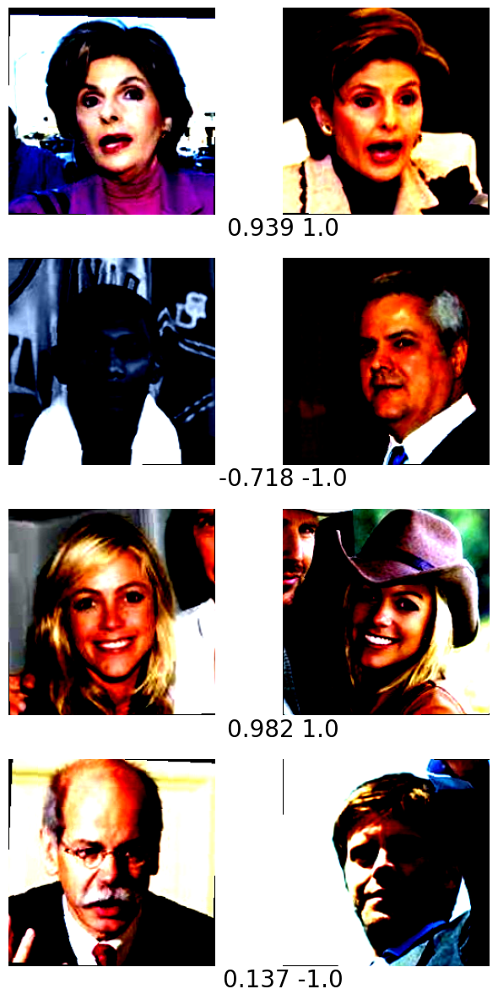

In [ ]:
sets=[train_dataset[i] for i in range(4)]
fig,axes= plt.subplots(4, 2, figsize=(6, 12))
for i,ax in enumerate(axes.flat):
    ax.imshow(sets[i//2][i%2].permute(1,2,0))
    ax.axis('off')

    if i%2==1:
        out=model(sets[i//2][0].unsqueeze(0),sets[i//2][1].unsqueeze(0))
        value=nn.functional.cosine_similarity(out[0], out[1], dim=1).item()
        ax.text(0, -0.1, str(str(np.round(value,3))+ ' ' + str(sets[i//2][2].item()) ), transform=ax.transAxes, fontsize=20, ha='center')
plt.tight_layout()
plt.show()

**All these test predictions are correct !!**

In [ ]:
sum=0
for i,batch in enumerate(dataload):
    out=model(batch[0].to(device),batch[1].to(device))
    value=nn.functional.cosine_similarity(out[0], out[1], dim=1)
    actual_value=batch[2]
    for val,actual in zip(value,actual_value):
        if ((val>0.34 and actual==1) or (val<=0.34 and actual==-1)):
            sum+=1
acc=sum/300
print(f'Accuracy of the Model is {acc}')

Accuracy of the Model is 0.7233333333333334


## The Model has an excellent Accuracy of the Model is 73% !

# Q10) Testing on a few images of mine and my friends

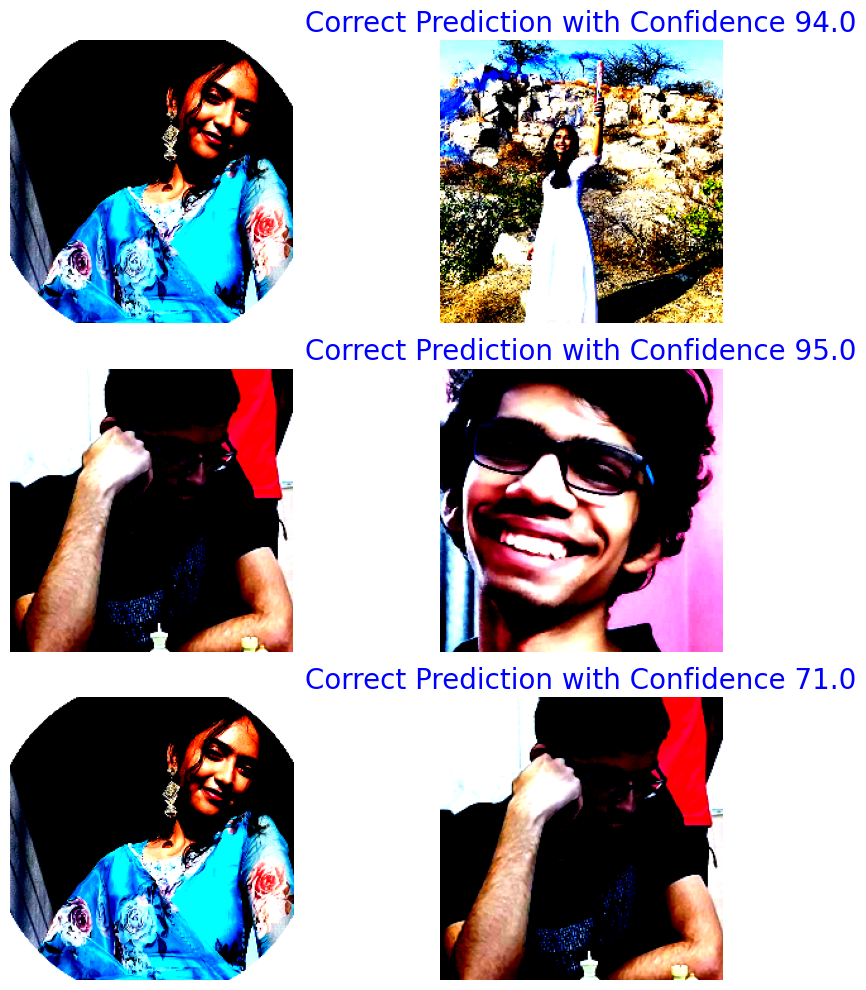

In [ ]:
i1=convert(read_image('/content/drive/MyDrive/img_1.png')[0:3])
i2=convert(read_image('/content/drive/MyDrive/img_2.png')[0:3])
i3=convert(read_image('/content/drive/MyDrive/aziz.png')[0:3])
i4=convert(read_image('/content/drive/MyDrive/i2.jpg')[0:3])
out1=model(i1.unsqueeze(0).to(device),i2.unsqueeze(0).to(device))
fig,axes=plt.subplots(3,2,figsize=(10, 10))
value=nn.functional.cosine_similarity(out1[0], out1[1], dim=1).item()

axes[0,0].imshow(i1.permute(1,2,0))
axes[0,0].axis('off')
axes[0,1].imshow(i2.permute(1,2,0))
axes[0,1].axis('off')
axes[0,1].set_title(predict(value,1),fontsize=20,color='b' )
axes[1,0].imshow(i3.permute(1,2,0))
axes[1,0].axis('off')
axes[1,1].imshow(i4.permute(1,2,0))
axes[1,1].axis('off')
out2=model(i3.unsqueeze(0).to(device),i4.unsqueeze(0).to(device))
value=nn.functional.cosine_similarity(out2[0], out2[1], dim=1).item()
axes[1,1].set_title(predict(value,-1),fontsize=20,color='b' )
axes[2,0].imshow(i1.permute(1,2,0))
axes[2,0].axis('off')
axes[2,1].imshow(i3.permute(1,2,0))
axes[2,1].axis('off')
out2=model(i1.unsqueeze(0).to(device),i3.unsqueeze(0).to(device))
value=nn.functional.cosine_similarity(out2[0], out2[1], dim=1).item()
axes[2,1].set_title(predict(value,-1),fontsize=20,color='b' )
plt.tight_layout()
plt.show()

### All the predictions of the model are correct. My model performs excellently on real-life images.

In [ ]:
files_test[0]

['/content/drive/MyDrive/Siamese/Claire_Danes/Claire_Danes_0001.jpg',
 '/content/drive/MyDrive/Siamese/Claire_Danes/Claire_Danes_0002.jpg',
 '/content/drive/MyDrive/Siamese/Claire_Danes/Claire_Danes_0003.jpg']

In [ ]:
index_test=index_test[20:]

In [ ]:
mod =SiameseNetwork(pre_trained_model)
mod_path =  '/content/drive/MyDrive/your_model.pth'  # model's path
mod.load_state_dict(torch.load(mod_path),strict=False)

_IncompatibleKeys(missing_keys=['fc.3.weight', 'fc.3.bias'], unexpected_keys=['fc.2.weight', 'fc.2.bias'])

In [ ]:
tst=SiameseDataset(files_test,index_test,300)
dataload=DataLoader(tst,100,shuffle=True)

In [ ]:
learning_rate = 0.001
num_epochs =10
cos_loss = nn.CosineEmbeddingLoss()
optimizer = torch.optim.Adagrad(model.parameters(), lr=learning_rate)
for epoch in tqdm(range(num_epochs)):
    train_one_epoch()
    validate_one_epoch()
# Save the model state dictionary to a specific path
model_path = '/content/drive/MyDrive/your_model.pth'  # Replace with your desired path
torch.save(model.state_dict(), model_path)

In [ ]:
with open('/content/drive/MyDrive/your_model.pth',"r") as reading:
    read=reading.readlines()
    print(read)

FileNotFoundError: ignored

In [ ]:
model=SiameseNetwork(pre_trained_model)

In [ ]:
class SiameseDataset(Dataset):
    def __init__(self,files,index,num,augment=True):
        self.num=num
        self.files=files
        self.index=index
        self.arg=augment
    def __len__(self):
        return self.num


    def __getitem__(self,i):
        #X=[]
        #Y=[]
        l=len(self.files) # no. of distict inputs
        k=len(self.index) # no. of inputs with more that 2 images of same person
        if (i%2!=0):
            m=np.random.choice(np.arange(l),2,replace=False) #choosing index for files
            i1=convert(read_image(np.random.choice(np.array(self.files[m[0]]),1,replace=False)[0]))
            i2=convert(read_image(np.random.choice(np.array(self.files[m[1]]),1,replace=False)[0]))
            augmentation=transforms.Compose([transforms.RandomHorizontalFlip(0.5),
            transforms.RandomRotation(5)
            # ,transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
            ])
            r=np.random.random(2)
            if (r[0] < 0.5 and self.arg):
                i1=augmentation(i1)
            if (r[1] <0.5 and self.arg):
                i2=augmentation(i2)
            return i1,i2,torch.tensor([0],dtype=torch.float)
            #X.append([i1,i2]),Y.append(torch.tensor(0,dtype=torch.float))
        else:
            m=np.random.randint(0,k) #choosing index for index list
            index_value=self.index[m]
            i1,i2=np.random.choice(np.array(self.files[index_value]),2,replace=False)
            i1=convert(read_image(i1))
            i2=convert(read_image(i2))
            augmentation=transforms.Compose([transforms.RandomHorizontalFlip(0.5),
            transforms.RandomRotation(5),
            #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
            ])
            r=np.random.random(2)
            if (r[0] < 0.5 and self.arg):
                i1=augmentation(i1)
            if (r[1] <0.5 and self.arg):
                i2=augmentation(i2)
            return i1,i2,torch.tensor([1],dtype=torch.float)
            #X.append([i1,i2]),Y.append(torch.tensor(1,dtype=torch.float))
        #return torch.tensor(X), torch.tensor(Y)



# Alternate Model Formulation for Siamese Network

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
pre_trained_model = models.resnet50(pretrained=True)
pre_trained_model = nn.Sequential(*list(pre_trained_model.children())[:-1])
for params in pre_trained_model.parameters():
    params.requires_grad = False
class SiameseNetwork(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()
        self.base_model = base_model
        self.fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.ReLU(),
            # nn.Dropout(0.1),
            nn.Linear(1024,128),
            nn.ReLU(),
            nn.Linear(128,32),
            nn.ReLU()
            # ,nn.Linear(128,64)
            # ,nn.ReLU()
        )
        self.cos = torch.nn.CosineSimilarity(dim=1, eps=1e-08)

    def forward_one(self, x):
        x = self.base_model(x)

        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return torch.abs(self.cos(output1, output2)).view(-1,1)
model=SiameseNetwork(pre_trained_model)
model=model.to(device)


In [ ]:
next(iter(train_loader))[0].shape, next(iter(train_loader))[1].shape, next(iter(train_loader))[2].shape

<ipython-input-3-fd0c147aa837>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inp=torch.tensor(inp).float()/255
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(
<ipython-input-5-57

(torch.Size([2, 3, 224, 224]), torch.Size([2, 3, 224, 224]), torch.Size([2]))

In [ ]:
def train_one_epoch():
    model.train()
    print(f'Epoch: {epoch + 1}')
    running_loss = 0.0
#setting up training of an epoch
    for batch_index, batch in enumerate(train_loader):
        x_batch_1,x_batch_2, y_batch = batch[0].to(device), batch[1].to(device), batch[2].to(device)


        output = model(x_batch_1,x_batch_2)
        #print(x_batch_1.dtype, )
        loss = bce_loss(output, y_batch)
        running_loss += loss.detach().item()#Calc aggregate Loss
        # print(output,loss,y_batch)

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()


        if batch_index % 10 == 9:  # print every 100 batches
            avg_loss_across_batches = running_loss / 10
            print('Batch {0}, Loss: {1:.3f}'.format(batch_index+1,
                                                    avg_loss_across_batches))
            running_loss = 0.0
    print()

In [ ]:
def validate_one_epoch():
    model.eval()
    running_loss = 0.0
 #setting up validating for an epoch
    for batch_index, batch in enumerate(test_loader):
        x_batch_1,x_batch_2, y_batch = batch[0].to(device), batch[1].to(device), batch[2].to(device)

        with torch.no_grad():
            output = model(x_batch_1,x_batch_2)
            loss = bce_loss(output, y_batch)
            running_loss += loss.item() #Calc aggregate Loss

    avg_loss_across_batches = running_loss / len(test_loader)

    print('Val Loss: {0:.3f}'.format(avg_loss_across_batches))
    print('***************************************************')
    print()

In [ ]:
learning_rate = 0.001
num_epochs =12
bce_loss = nn.BCELoss()
optimizer = torch.optim.Adagrad(model.parameters(), lr=learning_rate,weight_decay=1e-4)
for epoch in tqdm(range(num_epochs)):
    train_one_epoch()
    validate_one_epoch()
# Save the model state dictionary to a specific path
model_path = '/content/your_model.pth'  # Replace with your desired path
torch.save(model.state_dict(), model_path)

# Part B

## Initial Approach  to part B

In [ ]:
import torch
import numpy as np
import torchvision
from torchvision import transforms, datasets, models
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import os
import cv2
import torch.nn.functional as F
from torch.utils.data import Dataset
from skimage import io
import matplotlib.pyplot as plt
from torchvision.io import read_image
from google.colab.patches import cv2_imshow
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, Subset, DataLoader
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
torch.device('cuda:0')

device(type='cuda', index=0)

In [ ]:
files=[] # This list stores the names of the files
index=[] # This stores the index of the list where there are multiple faces of a single person
all=[]
j=0
for root,dir,file_name in os.walk('/content/drive/MyDrive/Siamese'):
    if(len(file_name) != 0): # file is not empty
        f=[]
        for k in file_name:
            f.append(os.path.join(root,k))
            all.append(os.path.join(root,k))
        files.append(f)
        if (len(file_name)>1):
            index.append(j) #storing index if len(file)>1
        j+=1


In [ ]:
def convert(inp):
    inp = inp.clone().detach().float() / 255
    transform=transforms.Compose([
        transforms.Resize(256),  # Resize to 256x256x3
        transforms.CenterCrop(224),  # Center-crop to 224
        # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Mean and SD of Resnet
    ])

    return transform(inp)

In [ ]:
class Dat(Dataset):
    def __init__(self,all,num):
        super().__init__()
        self.files = all
        self.num = num
    def __len__(self):
        return self.num
    def __getitem__(self,i):
        color_image= convert(read_image(self.files[i]))
        # grayscale_image = 0.299 * color_image[0] + 0.587 * color_image[1] + 0.114 * color_image[2]
        return color_image

def train_dataloader(train,batch_size):
    return DataLoader(train, batch_size=batch_size)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        # Simple CNN
        self.conv1 = nn.Conv2d(3, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(56180, 100)
        self.fc2 = nn.Linear(100, 1)


    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        # Flatten the tensor so it can be fed into the FC layers
        x = x.view(-1, 56180)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return torch.sigmoid(x)

In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_dim=100):
        super().__init__()
        self.lin1 = nn.Linear(latent_dim, 12*12*64)  # [n, 256, 7, 7]
        self.ct1 = nn.ConvTranspose2d(64, 32, 4, stride=2) # [n, 64, 26, 26]
        self.ct2 = nn.ConvTranspose2d(32, 16, 4, stride=2) # [n, 16, 54, 54]
        self.ct3 = nn.ConvTranspose2d(16, 8, 4, stride=2) # [n, 8, 110, 110]
        self.ct4 = nn.ConvTranspose2d(8, 4, 4, stride=2) # [n, 4, 222, 222]
        self.conv = nn.Conv2d(4, 3, kernel_size=7)  # [n, 3, 64, 64]
        self.trans=transforms.Resize(224)
        # self.transform=transforms.Pad((2, 2), fill=0)


    def forward(self, x):
        # Pass latent space input into linear layer and reshape
        x = self.lin1(x)
        x = F.relu(x)
        x = x.view(-1, 64, 12, 12)

        # Upsample (transposed conv) 16x16 (64 feature maps)
        x = self.ct1(x)
        x = F.relu(x)

        # Upsample to 34x34 (16 feature maps)
        x = self.ct2(x)
        x = F.relu(x)

        x=self.ct3(x)

        x=F.relu(x)
        x=self.ct4(x)
        x=F.relu(x)
        x=self.conv(x)
        x=self.trans(x)
        x=F.tanh(x)
        # print(x.shape)
        # x=self.transform(x)
        # print('Generator', x.shape)
        # Convolution to 28x28 (1 feature map)
        return x

In [ ]:
Generator()(torch.randn(8,100)).shape

torch.Size([8, 3, 224, 224])

In [ ]:
# TODO: GAN
import torchvision.utils as vutils
batch_size=64
class GAN(nn.Module):
    def __init__(self,latent_dim=100,lr1=0.00005,lr2=0.00005):
        super().__init__()
        self.lat=latent_dim
        self.lr1=lr1
        self.lr2=lr2
        self.gen=Generator()
        self.dis=Discriminator()

        self.gen=self.gen.apply(weights_init)
        self.dis=self.dis.apply(weights_init)

        self.opt1=torch.optim.Adam(self.gen.parameters(),lr=self.lr1)
        self.opt2=torch.optim.Adam(self.dis.parameters(),lr=self.lr2)
        self.validation_z=torch.randn(batch_size,self.lat)
    def forward(self,z):
        return self.gen(z)
    def adversarial_loss(self,y_hat,y):
        return F.binary_cross_entropy(y_hat,y).to(device)
    def loss_gen(self,batch):
        real_imgs=batch
        z=torch.randn(real_imgs.shape[0],self.lat).to(device)
        fake_imgs=self(z)
        y_hat=self.dis(fake_imgs)
        y=torch.ones(real_imgs.size(0),1).to(device)
        g_loss=self.adversarial_loss(y_hat,y)
        # print(g_loss.detach().item())
        return g_loss
    def loss_dis(self,batch):
        y_hat_real=self.dis(batch)
        y_real=torch.ones(batch.shape[0],1).to(device)
        real_loss=self.adversarial_loss(y_hat_real,y_real)
        z=self.validation_z.to(device)
        y_hat_fake=self.dis(self(z)).to(device)
        y_fake=torch.zeros(batch.shape[0],1).to(device)
        fake_loss=self.adversarial_loss(y_hat_fake,y_fake)
        # print(((fake_loss+real_loss)/2).detach().item())
        return (fake_loss+real_loss)/2

    def plot_imgs(self):
        z=torch.randn(16,100).to(device)

        images = self(z).detach().cpu() # 16 images, 3 channels, 224x224 pixels

        # grid of images
        grid = vutils.make_grid(images, nrow=4, padding=2, normalize=True)


        # Display the grid using Matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(grid.permute(1, 2, 0))  # Permute the dimensions for displaying in Matplotlib
        plt.axis('off')  # Turn off axis labels
        plt.show()

    def train_epoch(self):
        self.gen.train(True)
        self.dis.train(True)
        print(f'Epoch: {epoch+1}')
        for batch_index, batch in enumerate(train_loader):
            batch=batch.to(device)
            self.opt2.zero_grad()
            dis_loss=self.loss_dis(batch)
            dis_loss.backward()
            self.opt2.step()

            self.opt1.zero_grad()
            gen_loss=self.loss_gen(batch)
            gen_loss.backward()
            self.opt1.step()
        if(epoch%1==0):
            self.plot_imgs()

In [ ]:
def plot(model):
    z=torch.randn(16,100).to(device)

    images = model(z).detach().cpu() # 16 images, 3 channels, 224x224 pixels

    # grid of images
    grid = vutils.make_grid(images, nrow=4, padding=2, normalize=True)


    # Display the grid using Matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(grid.permute(1, 2, 0))  # Permute the dimensions for displaying in Matplotlib
    plt.axis('off')  # Turn off axis labels
    plt.show()

# Part-B Final Approach

## Q11) Train a generative model for generating face images, using a GAN

In [ ]:
import torch
import numpy as np
import torchvision
import tarfile
from torchvision import transforms, datasets, models
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import os
import cv2
import torch.nn.functional as F
from torch.utils.data import Dataset
from skimage import io
import matplotlib.pyplot as plt
from torchvision.io import read_image
from google.colab.patches import cv2_imshow
from tqdm.notebook import tqdm
from torch.utils.data import Dataset, Subset, DataLoader
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
!wget http://vis-www.cs.umass.edu/lfw/lfw.tgz #path

--2023-10-22 18:51:33--  http://vis-www.cs.umass.edu/lfw/lfw.tgz
Resolving vis-www.cs.umass.edu (vis-www.cs.umass.edu)... 128.119.244.95
Connecting to vis-www.cs.umass.edu (vis-www.cs.umass.edu)|128.119.244.95|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 180566744 (172M) [application/x-gzip]
Saving to: ‘lfw.tgz’

lfw.tgz             100%[===================>] 172.20M  1.12MB/s    in 3m 5s   

2023-10-22 18:54:39 (953 KB/s) - ‘lfw.tgz’ saved [180566744/180566744]



In [ ]:
with tarfile.open('/content/lfw.tgz', 'r') as tar: #extracting tar file
    tar.extractall(path='/content/set')

In [ ]:
files=[] # This list stores the names of the files
index=[] # This stores the index of the list where there are multiple faces of a single person
all=[]
j=0
for root,dir,file_name in os.walk('/content/set/lfw'):
    if(len(file_name) != 0): # file is not empty
        f=[]
        for k in file_name:
            f.append(os.path.join(root,k))
            all.append(os.path.join(root,k))
        files.append(f)
        if (len(file_name)>1):
            index.append(j) #storing index if len(file)>1
        j+=1

In [ ]:
def convert(inp): #converting input to feed the Resnet model
    inp = inp.clone().detach().float() / 255
    transform=transforms.Compose([
        transforms.Resize(256),  # Resize to 256x256x3
        transforms.CenterCrop(224),  # Center-crop to 224
        # transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Mean and SD of Resnet
    ])

    return transform(inp)

In [ ]:
def weights_init(m): #weight initialization
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
class Generator(nn.Module): #Repeated Conv2d Layers followed by Tanh
    def __init__(self, latent_dim=100):
        super().__init__()
        self.lat=latent_dim
        self.fc=nn.Sequential(
                        nn.ConvTranspose2d(100,64*8 , 16,1,0,bias=False),
                        nn.BatchNorm2d(64 * 8),
                        nn.ReLU(),

                        nn.ConvTranspose2d(64*8,64*4 , 4,1,0,bias=False),
                        nn.BatchNorm2d(64 * 4),
                        nn.ReLU(),

                         nn.ConvTranspose2d(64*4,64*2 , 4,2,1,bias=False),  # [n, 64*4, 26, 26]
                         nn.BatchNorm2d(64 * 2),
                         nn.ReLU(),

                         nn.ConvTranspose2d(64*2, 64, 4,2,1,bias=False), # [n, 64*4, 54, 54]
                         nn.BatchNorm2d(64),
                         nn.ReLU(),

                         nn.ConvTranspose2d(64, 3, 4,2,1,bias=False), # [n, 64*4, 222, 222]
                         nn.Tanh()
                         )
        self.trans=transforms.Resize(224)
        # self.transform=transforms.Pad((2, 2), fill=0)


    def forward(self, x):
        # Pass latent space input into linear layer and reshape
        x = x.view(-1, 100, 1, 1)
        x = self.fc(x)
        x=self.trans(x)
        return x

In [ ]:
class Discriminator(nn.Module): #Similarly for Discriminator
    def __init__(self): #Repeated Conv2d Layers followed by sigmoid
        super().__init__()
        self.fc=nn.Sequential(
            nn.Conv2d(3,16,4,2,1,bias=False),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(16,32,4,2,1,bias=False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(32, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64 , 64*2 , 4, 2, 1, bias=False),
            nn.BatchNorm2d(64*2 ),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64*2, 64 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64 * 4, 64 * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64 * 8),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64 * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        self.trans=transforms.Resize(256)
    def forward(self, input):
        out1=self.trans(input)
        out2=self.fc(out1)
        out2=out2.view(-1,1)
        return out2

In [ ]:
class Dat(Dataset):
    def __init__(self,all,num):
        super().__init__()
        self.files = all
        self.num = num
    def __len__(self):
        return self.num
    def __getitem__(self,i):
        color_image= convert(read_image(self.files[i]))
        # grayscale_image = 0.299 * color_image[0] + 0.587 * color_image[1] + 0.114 * color_image[2]
        return color_image

def train_dataloader(train,batch_size):
    return DataLoader(train, batch_size=batch_size)

In [ ]:

import torchvision.utils as vutils
batch_size=64
class GAN(nn.Module): #Initiating GAN()
    def __init__(self,latent_dim=100,lr1=0.0001,lr2=0.0001):
        super().__init__()
        self.lat=latent_dim
        self.lr1=lr1
        self.lr2=lr2
        self.gen=Generator()
        self.dis=Discriminator()

        self.gen=self.gen.apply(weights_init)
        self.dis=self.dis.apply(weights_init)

        self.opt1=torch.optim.Adam(self.gen.parameters(),lr=self.lr1)
        self.opt2=torch.optim.Adam(self.dis.parameters(),lr=self.lr2)
        self.validation_z=torch.randn(batch_size,self.lat)
    def forward(self,z):
        return self.gen(z)
    def adversarial_loss(self,y_hat,y):
        return F.binary_cross_entropy(y_hat,y).to(device)
    def loss_gen(self,batch):
        real_imgs=batch
        z=torch.randn(real_imgs.shape[0],self.lat).to(device)
        fake_imgs=self(z)
        y_hat=self.dis(fake_imgs)
        y=torch.ones(real_imgs.size(0),1).to(device)
        g_loss=self.adversarial_loss(y_hat,y)
        # print(g_loss.detach().item())
        return g_loss
    def loss_dis(self,batch):
        y_hat_real=self.dis(batch)
        y_real=torch.ones(batch.shape[0],1).to(device)
        real_loss=self.adversarial_loss(y_hat_real,y_real)
        z=self.validation_z.to(device)
        y_hat_fake=self.dis(self(z)).to(device)
        y_fake=torch.zeros(batch.shape[0],1).to(device)
        fake_loss=self.adversarial_loss(y_hat_fake,y_fake)
        # print(((fake_loss+real_loss)/2).detach().item())
        return (fake_loss+real_loss)/2

    def plot_imgs(self):
        z=torch.randn(16,100).to(device)

        images = self(z).detach().cpu() # 16 images, 3 channels, 224x224 pixels

        # grid of images
        grid = vutils.make_grid(images, nrow=4, padding=2, normalize=True)


        # Display the grid using Matplotlib
        plt.figure(figsize=(10, 10))
        plt.imshow(grid.permute(1, 2, 0))  # Permute the dimensions for displaying in Matplotlib
        plt.axis('off')  # Turn off axis labels
        plt.show()

    def train_epoch(self): #Defining Epoch
        self.gen.train(True)
        self.dis.train(True)
        print(f'Epoch: {epoch+1}')
        for batch_index, batch in enumerate(train_loader):
            batch=batch.to(device)
            self.opt2.zero_grad()
            dis_loss=self.loss_dis(batch)
            dis_loss.backward()
            self.opt2.step()

            self.opt1.zero_grad()
            gen_loss=self.loss_gen(batch)
            gen_loss.backward()
            self.opt1.step()
        if(epoch%2==0):
            self.plot_imgs()

In [ ]:
dataset=Dat(all,6400)
train_loader=train_dataloader(dataset,batch_size)
model= GAN()
model.to(device)

GAN(
  (gen): Generator(
    (fc): Sequential(
      (0): ConvTranspose2d(100, 512, kernel_size=(16, 16), stride=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU()
      (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (11): ReLU()
      (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (13): Tanh()
    )
    (trans): Resize(

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1


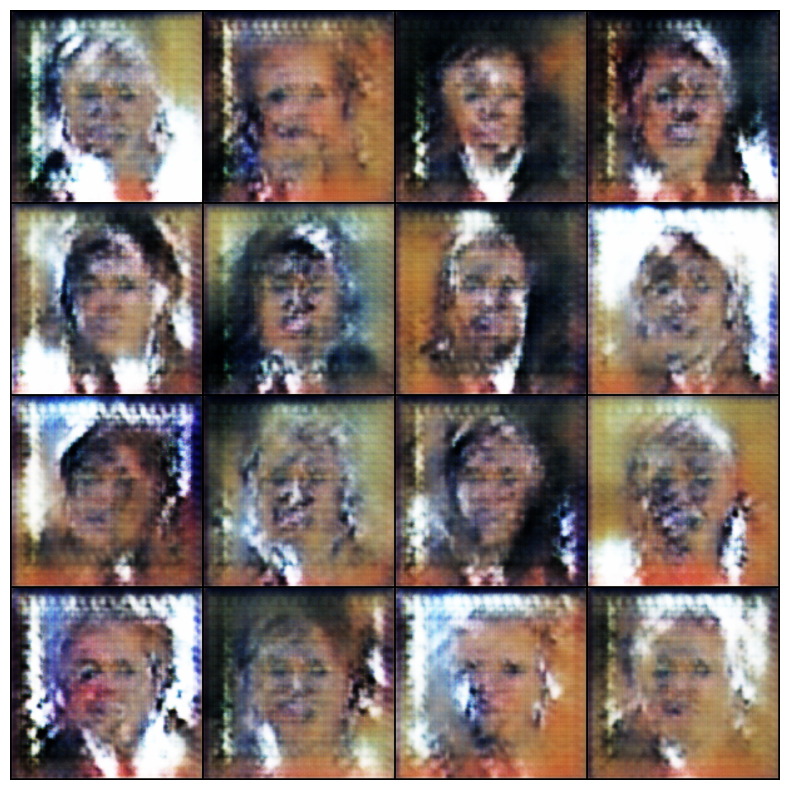

Epoch: 3


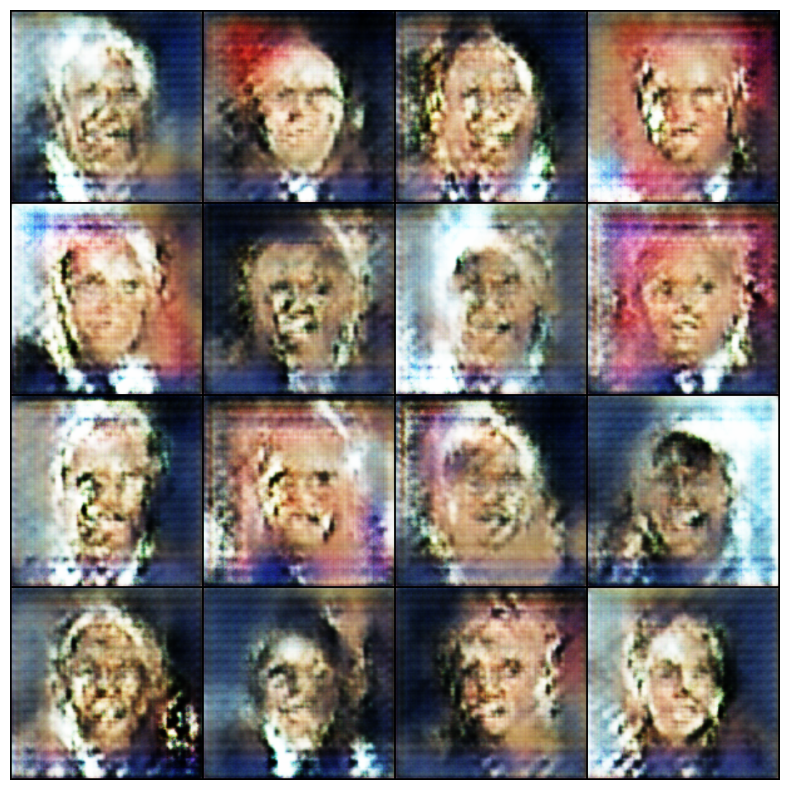

Epoch: 5


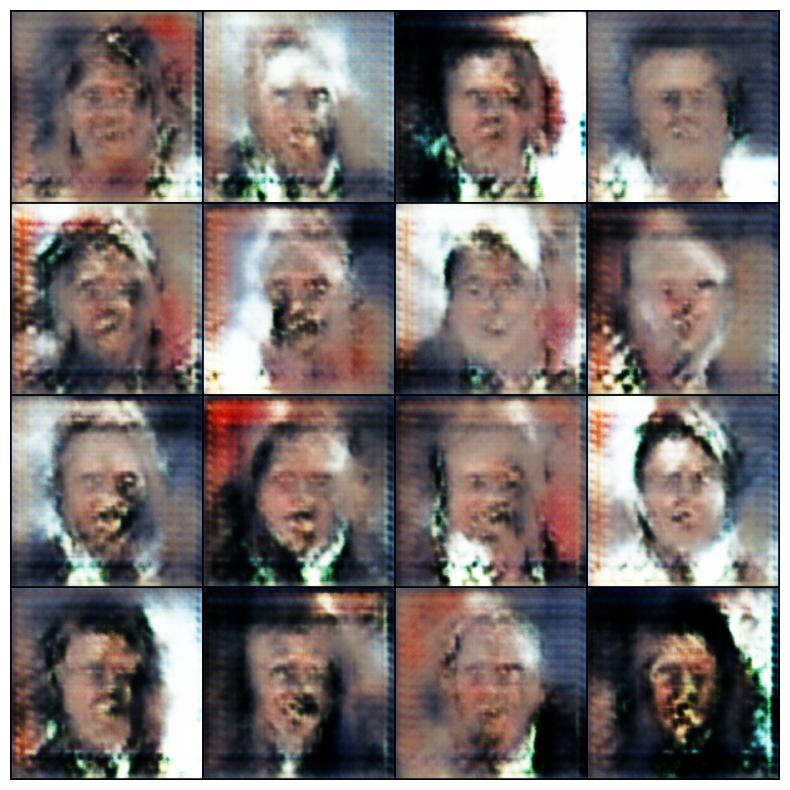

Epoch: 7


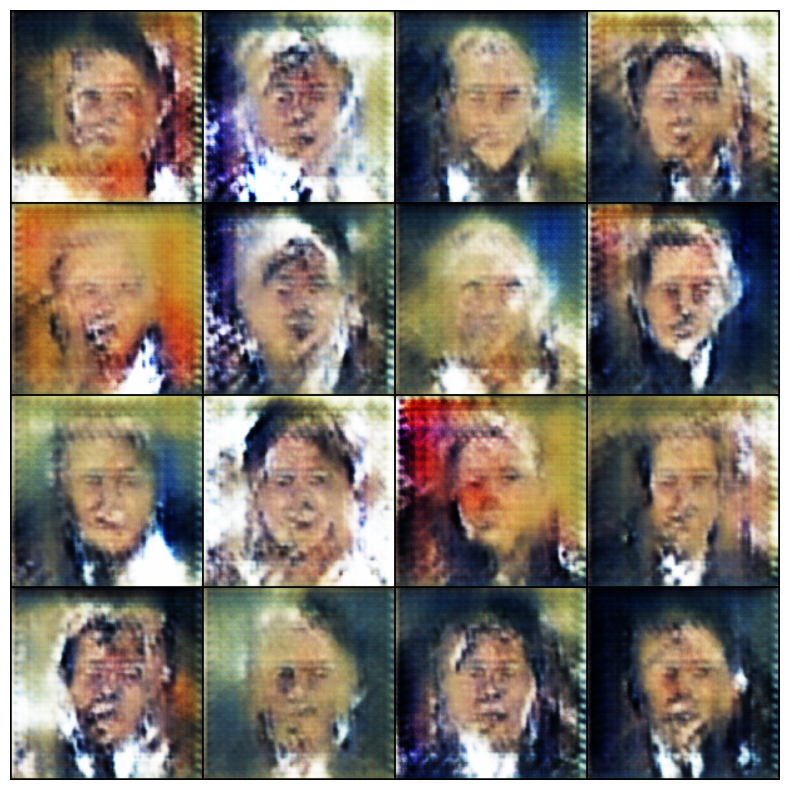

Epoch: 9


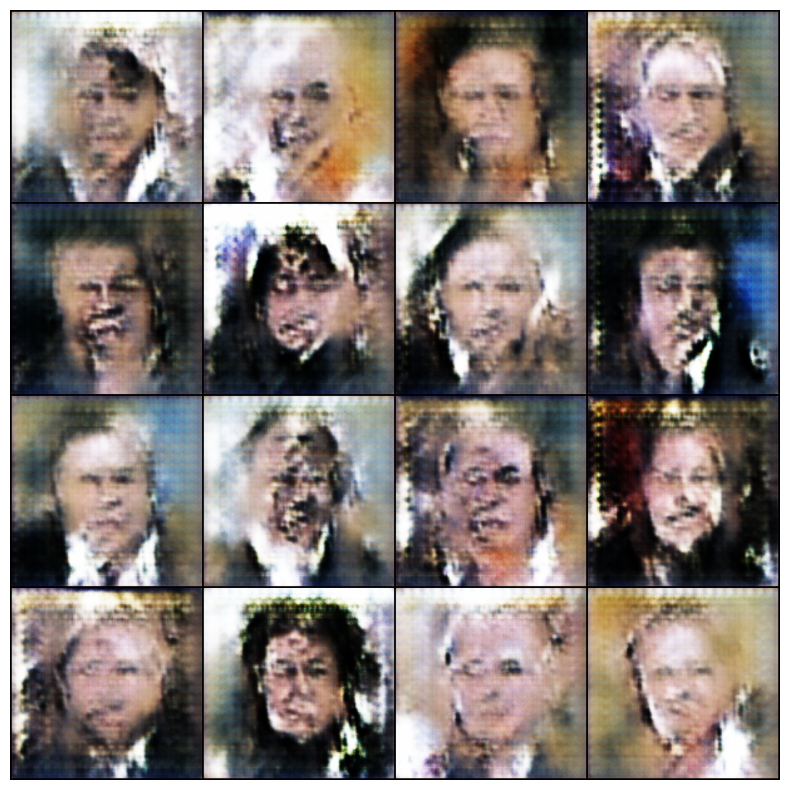

Epoch: 11


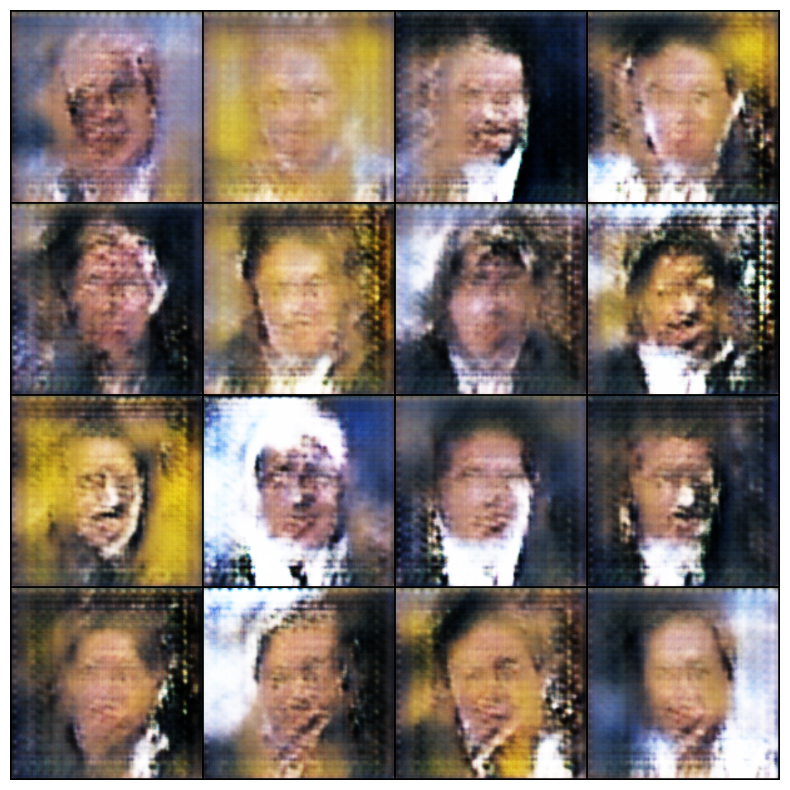

Epoch: 13


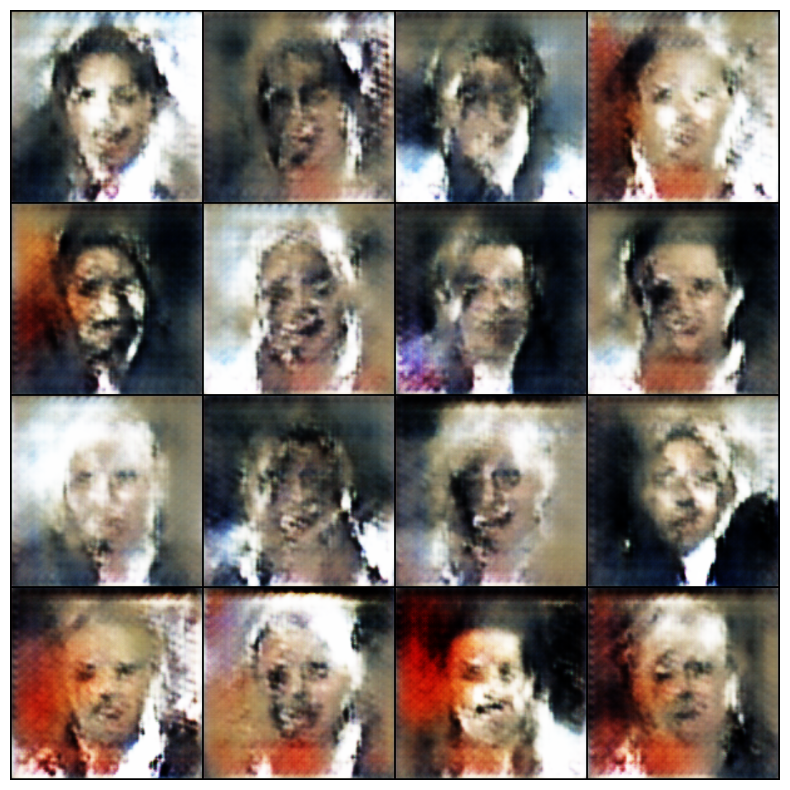

Epoch: 15


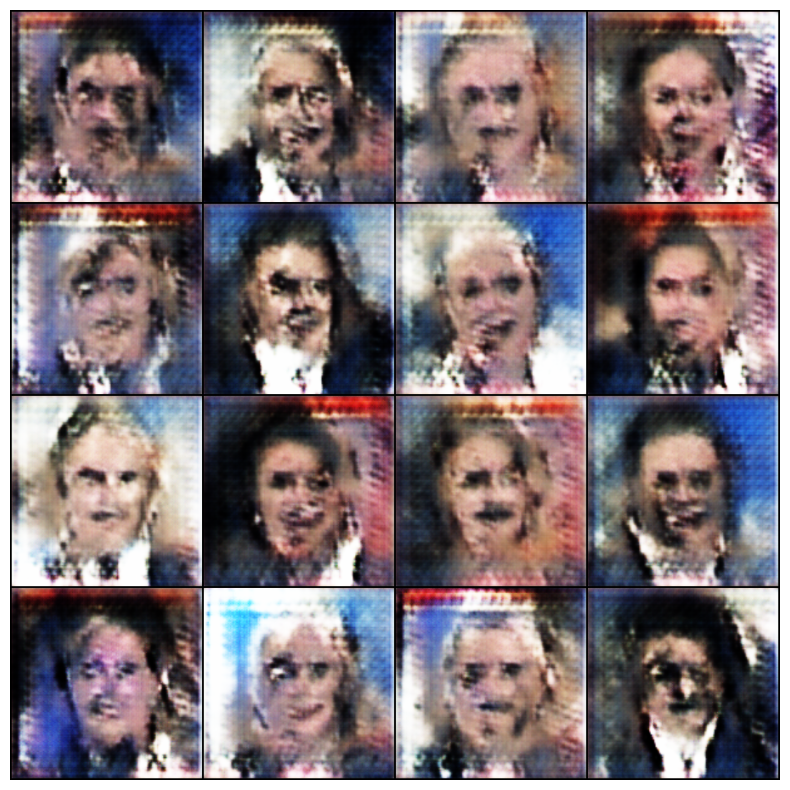

Epoch: 17


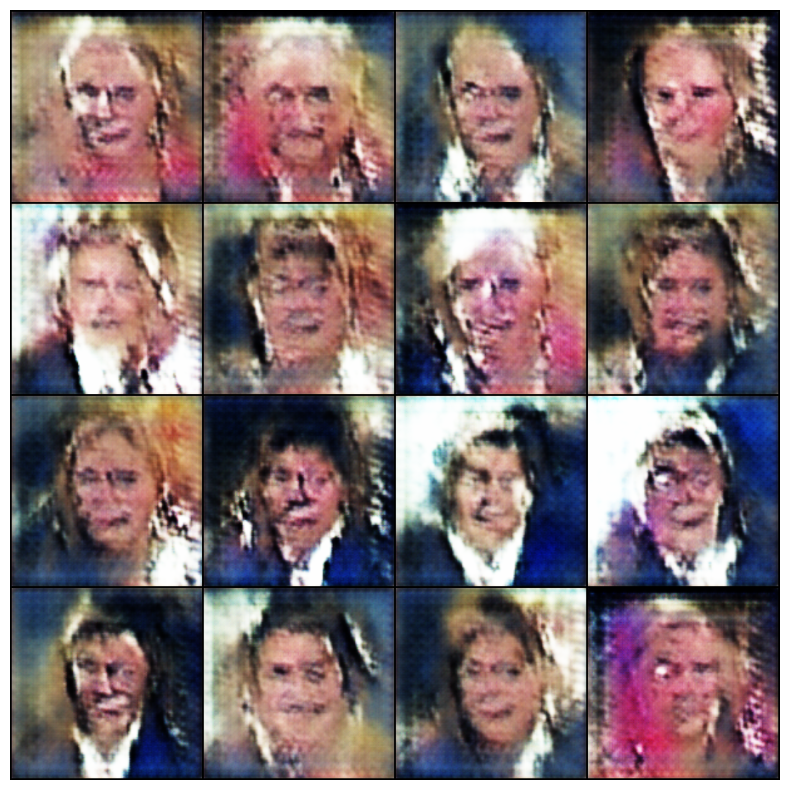

Epoch: 19


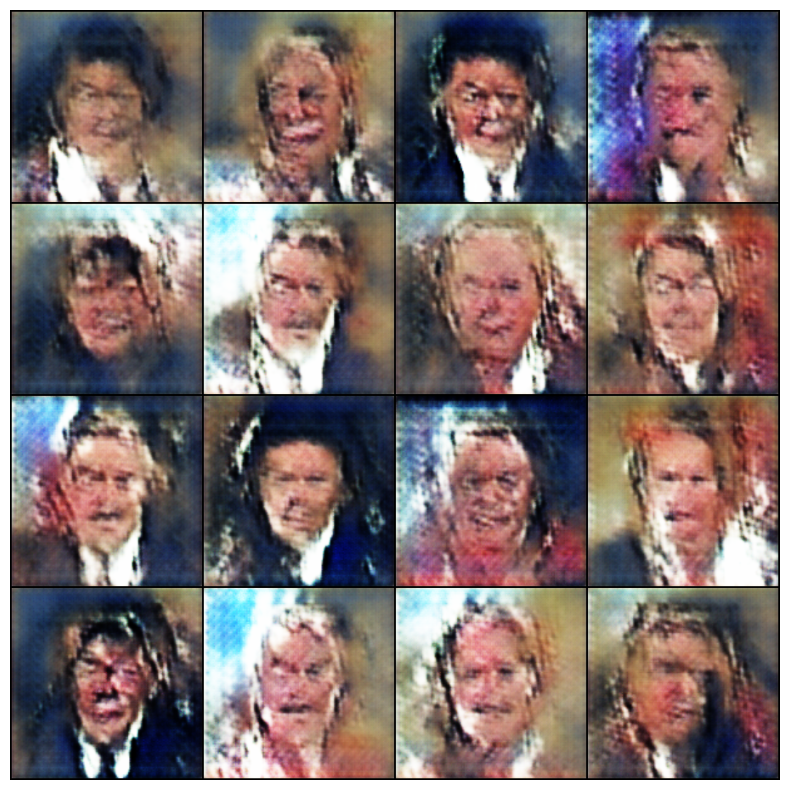

In [ ]:
for epoch in tqdm(np.arange(0,20,2)):
    model.train_epoch()

In [ ]:
model_path = '/content/drive/MyDrive/GAN.pth'  # Replace with your desired path
torch.save(model, model_path)

#Q12) BONUS: CGAN to generate another image of the same person by using the Siamese network

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
import torchvision.models as models
pre_trained_model = models.resnet50(pretrained=True)
pre_trained_model = nn.Sequential(*list(pre_trained_model.children())[:-1])
for params in pre_trained_model.parameters():
    params.requires_grad = False
class SiameseNetwork(nn.Module):
    def __init__(self, base_model):
        super(SiameseNetwork, self).__init__()
        self.base_model = base_model
        self.fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(1024,128)
            # nn.ReLU(),
            # nn.Linear(128,32),
            # nn.ReLU()
            # ,nn.Linear(128,64)
            # ,nn.ReLU()
        )
        self.cos = torch.nn.CosineSimilarity(dim=1, eps=1e-08)
        # self.fc.weight.requires_grad = True  # Ensure requires_grad is set to True
        # self.fc.bias.requires_grad = True
    def forward_one(self, x):
        x = self.base_model(x)

        x = x.view(x.size()[0], -1)
        x = self.fc(x)
        return x

    def forward(self, input1, input2):
        output1 = self.forward_one(input1)
        output2 = self.forward_one(input2)
        return output1,output2
# model=SiameseNetwork(pre_trained_model)
# model=model.to(device)
# model
# for param in model.parameters():
#     param.requires_grad = True

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 113MB/s]


In [ ]:
batch_size=32
model_path='/content/drive/MyDrive/your_model.pth' #Model Path
Siamese=SiameseNetwork(pre_trained_model)
state_dict = torch.load(model_path,map_location=torch.device('cpu')) # loading the model in CPU
Siamese.load_state_dict(state_dict)
Siamese.to(device);

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
mult=[]
for i in index:
    if len(files[i])>52:
        mult.append(i)

mul=mult[0:5]
base_files=[files[i] for i in mul]

In [ ]:
class Generator1(nn.Module): #Generator with Labels encoding!
    def __init__(self, latent_dim=100):
        super().__init__()
        self.lat=latent_dim
        self.label_emb = nn.Embedding(5, 10) #Embed labels
        self.fc=nn.Sequential(
                        nn.ConvTranspose2d(110,64*8 , 16,1,0,bias=False),
                        nn.BatchNorm2d(64 * 8),
                        nn.ReLU(),

                        nn.ConvTranspose2d(64*8,64*4 , 4,1,0,bias=False),
                        nn.BatchNorm2d(64 * 4),
                        nn.ReLU(),

                         nn.ConvTranspose2d(64*4,64*2 , 4,2,1,bias=False),  # [n, 64*4, 26, 26]
                         nn.BatchNorm2d(64 * 2),
                         nn.ReLU(),

                         nn.ConvTranspose2d(64*2, 64, 4,2,1,bias=False), # [n, 64*4, 54, 54]
                         nn.BatchNorm2d(64),
                         nn.ReLU(),

                         nn.ConvTranspose2d(64, 3, 4,2,1,bias=False), # [n, 64*4, 222, 222]
                         nn.Tanh()
                         )
        self.trans=transforms.Resize(224)
        # self.transform=transforms.Pad((2, 2), fill=0)


    def forward(self, x,labels):
        lab=self.label_emb(labels)
        # Pass latent space input into linear layer and reshape
        x = x.view(-1, 100)
        # print(x,lab)
        x=torch.cat([x,lab],1)
        x = x.view(-1, 110,1,1)
        x = self.fc(x)
        x=self.trans(x)
        return x

In [ ]:
class CGAN_Dat(Dataset): #CGAN Dataset
    def __init__(self,base_files,num):
        super().__init__()
        self.files = base_files
        self.num = num
    def __len__(self):
        return self.num
    def __getitem__(self,i):
        n=i%5
        l=len(self.files[n])
        r=np.random.randint(l)
        color_image= convert(read_image(self.files[n][r]))
        # grayscale_image = 0.299 * color_image[0] + 0.587 * color_image[1] + 0.114 * color_image[2]
        return color_image,n

def train_dataloader(train,batch_size):
    return DataLoader(train, batch_size=batch_size)

In [ ]:
train=CGAN_Dat(base_files,3200)
train_loader=train_dataloader(train,batch_size=batch_size)

In [ ]:
import torchvision.utils as vutils
batch_size=64
class CGAN(nn.Module):
    def __init__(self,latent_dim=100,lr1=0.001):
        super().__init__()
        self.lat=latent_dim
        self.lr1=lr1
        self.gen=Generator1(latent_dim)

        self.gen.apply(weights_init)

        self.opt1=torch.optim.Adam(self.gen.parameters(),lr=self.lr1)

        self.validation_z=torch.randn(batch_size,self.lat)
    def forward(self,z,labels):
        return self.gen(z,labels)

def adversarial_loss(y_hat,y):
    return F.binary_cross_entropy(y_hat,y).to(device)

cos_loss = nn.CosineEmbeddingLoss()

def train_epoch(model):
    model.train()
    for _,batch in enumerate(train_loader):
        batch[0]=batch[0].to(device)
        batch[1]=batch[1].to(device)
        out=model(torch.randn(batch[0].shape[0],100).to(device),batch[1])

        i=Siamese(out,batch[0])

        y_hat=((F.cosine_similarity(i[0], i[1], dim=1)+1)/2).reshape(-1,1)
        y=torch.ones(batch[0].shape[0],1).to(device)
        # y=torch.ones(batch[0].shape[0]).to(device)
        # loss=cos_loss(i[0], i[1],y)
        loss=F.binary_cross_entropy(y_hat,y)
        print(loss.detach().item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    if(epoch%1==0):
        plot_imgs(model)

In [ ]:
def plot_imgs(model):
    z=torch.randn(20,100).to(device)
    images = model(z,torch.arange(0, 5).repeat(4).to(device)).detach().cpu() # 16 images, 3 channels, 224x224 pixels

    # grid of images
    grid = vutils.make_grid(images, nrow=4, padding=2, normalize=True)


    # Display the grid using Matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(grid.permute(1, 2, 0))  # Permute the dimensions for displaying in Matplotlib
    plt.axis('off')  # Turn off axis labels
    plt.show()

In [ ]:
model=CGAN().to(device)

  0%|          | 0/2 [00:00<?, ?it/s]

Epoch: 1


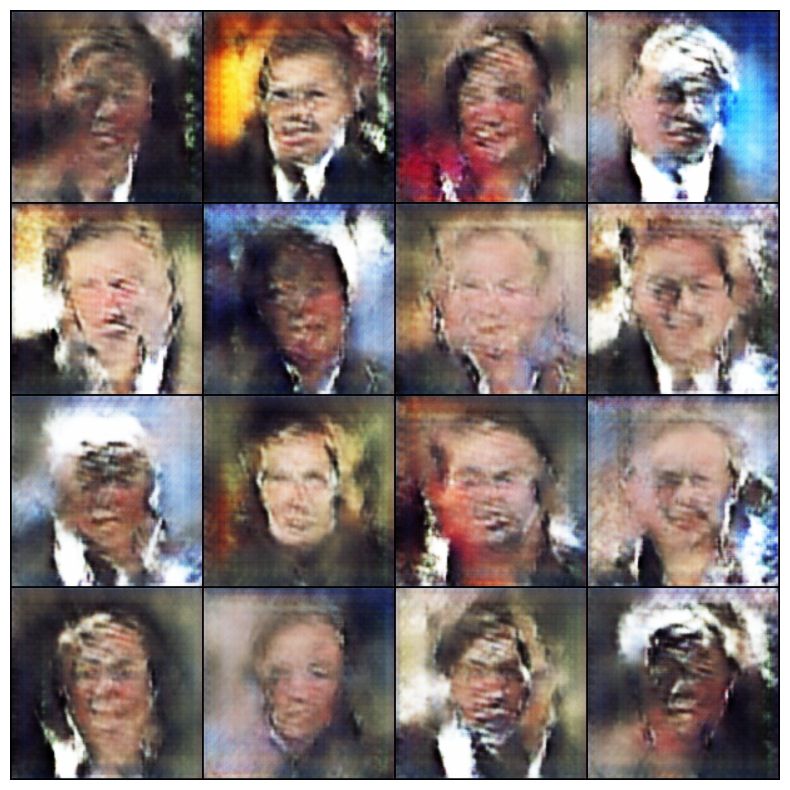

Epoch: 3


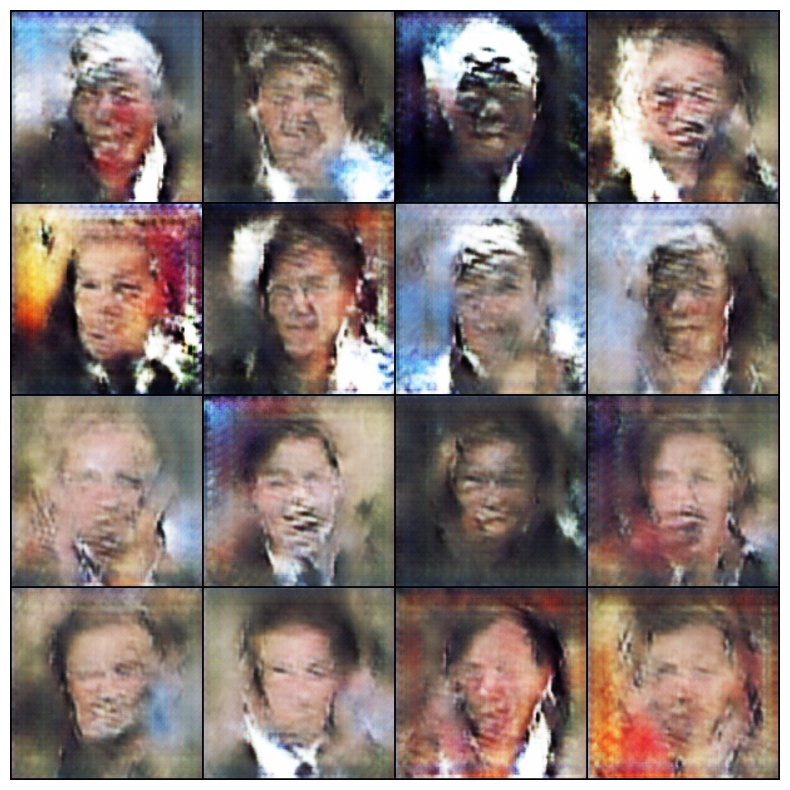

In [ ]:
for epoch in tqdm(np.arange(0,4,2)):
    model.train_epoch()

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0002)
for epoch in tqdm(range(20)):
        train_epoch(model)

**Each epoch output deleted as it was crossing 50 MB and file couldn't be uploaded**

In [ ]:
model_path = '/content/drive/MyDrive/C_GAN.pth'  # Replace with your desired path
torch.save(model, model_path)